# Exploratory Data Analysis the Hepatitis C Dataset
### Authors:
- Xavier Santos nº68271
- Rodrigo Ferreira nº104737
- Ludovico Dolcini nº101730

The data set contains laboratory values of blood donors and Hepatitis C patients and demographic values.
The target attribute for classification is Category (blood donors vs. Hepatitis C (including its progress ('just' Hepatitis C, Fibrosis, Cirrhosis).

All attributes except Category and Sex are numerical. The laboratory data are the attributes 5-14.
1) X (Patient ID/No.)
2) Category (diagnosis) (values: '0=Blood Donor', '0s=suspect Blood Donor', '1=Hepatitis', '2=Fibrosis', '3=Cirrhosis')
3) Age (in years)
4) Sex (f,m)
5) ALB (albumin)
6) ALP (alkaline phosphatase)
7) ALT (alanine aminotransferease)
8) AST (aspartate aminotransferase)
9) BIL (bilirubin)
10) CHE (cholinesterase)
11) CHOL (cholesterol)
12) CREA (creatinine)
13) GGT (gamma-glutamyl transpeptidase)
14) PROT (protein)

In [1]:
###imports
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from scipy import stats

First the raw data is imported from a csv to a data frame structure.

In [2]:
###getting the dataframe
df = pd.read_csv("hcvdat0.csv")
df

,Unnamed: 0,Category,Age,Sex,ALB,ALP,ALT,AST,BIL,CHE,CHOL,CREA,GGT,PROT
0,1,0=Blood Donor,32,m,38.5,52.5,7.7,22.1,7.5,6.93,3.23,106.0,12.1,69.0
1,2,0=Blood Donor,32,m,38.5,70.3,18.0,24.7,3.9,11.17,4.80,74.0,15.6,76.5
2,3,0=Blood Donor,32,m,46.9,74.7,36.2,52.6,6.1,8.84,5.20,86.0,33.2,79.3
3,4,0=Blood Donor,32,m,43.2,52.0,30.6,22.6,18.9,7.33,4.74,80.0,33.8,75.7
4,5,0=Blood Donor,32,m,39.2,74.1,32.6,24.8,9.6,9.15,4.32,76.0,29.9,68.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
610,611,3=Cirrhosis,62,f,32.0,416.6,5.9,110.3,50.0,5.57,6.30,55.7,650.9,68.5
611,612,3=Cirrhosis,64,f,24.0,102.8,2.9,44.4,20.0,1.54,3.02,63.0,35.9,71.3
612,613,3=Cirrhosis,64,f,29.0,87.3,3.5,99.0,48.0,1.66,3.63,66.7,64.2,82.0
613,614,3=Cirrhosis,46,f,33.0,NaN,39.0,62.0,20.0,3.56,4.20,52.0,50.0,71.0


We'll check the dataset for objects with missing values and then decide how to deal with them.

In [3]:

df.isnull().sum()

Unnamed: 0     0
Category       0
Age            0
Sex            0
ALB            1
ALP           18
ALT            1
AST            0
BIL            0
CHE            0
CHOL          10
CREA           0
GGT            0
PROT           1
dtype: int64

To deal with the missing values, we've decided to substitute them for the mean of the respective column.

In [4]:
df['ALB'].fillna(value=df['ALB'].mean(), inplace=True)
df['ALP'].fillna(value=df['ALP'].mean(), inplace=True)
df['ALT'].fillna(value=df['ALT'].mean(), inplace=True)
df['CHOL'].fillna(value=df['CHOL'].mean(), inplace=True)
df['PROT'].fillna(value=df['PROT'].mean(), inplace=True)
df.isnull().sum()

Unnamed: 0    0
Category      0
Age           0
Sex           0
ALB           0
ALP           0
ALT           0
AST           0
BIL           0
CHE           0
CHOL          0
CREA          0
GGT           0
PROT          0
dtype: int64

The dataset contains two categorical atributes: category and sex. To deal with this, this features will be converted to a numeric binary value (for Category: Blood Donor=0, suspect Blood Donor=1, Hepatitis=2, Fibrosis=3, Cirrhosis=4; for Sex: Male=0, Female=1).

In [5]:
df['Category'] = df['Category'].map({'0=Blood Donor':0,'0s=suspect Blood Donor':1, '1=Hepatitis':2 , '2=Fibrosis':3, '3=Cirrhosis':4})

sex_mapping = {'f':1,'m': 0}
df['Sex'] = df['Sex'].map(sex_mapping)

df

,Unnamed: 0,Category,Age,Sex,ALB,ALP,ALT,AST,BIL,CHE,CHOL,CREA,GGT,PROT
0,1,0,32,0,38.5,52.50000,7.7,22.1,7.5,6.93,3.23,106.0,12.1,69.0
1,2,0,32,0,38.5,70.30000,18.0,24.7,3.9,11.17,4.80,74.0,15.6,76.5
2,3,0,32,0,46.9,74.70000,36.2,52.6,6.1,8.84,5.20,86.0,33.2,79.3
3,4,0,32,0,43.2,52.00000,30.6,22.6,18.9,7.33,4.74,80.0,33.8,75.7
4,5,0,32,0,39.2,74.10000,32.6,24.8,9.6,9.15,4.32,76.0,29.9,68.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
610,611,4,62,1,32.0,416.60000,5.9,110.3,50.0,5.57,6.30,55.7,650.9,68.5
611,612,4,64,1,24.0,102.80000,2.9,44.4,20.0,1.54,3.02,63.0,35.9,71.3
612,613,4,64,1,29.0,87.30000,3.5,99.0,48.0,1.66,3.63,66.7,64.2,82.0
613,614,4,46,1,33.0,68.28392,39.0,62.0,20.0,3.56,4.20,52.0,50.0,71.0


The first column contains the ID of the object. As it doesn't provide any useful information in the analysis of the data, this column will be removed.

In [6]:
df = df.drop(columns=['Unnamed: 0'])
df

,Category,Age,Sex,ALB,ALP,ALT,AST,BIL,CHE,CHOL,CREA,GGT,PROT
0,0,32,0,38.5,52.50000,7.7,22.1,7.5,6.93,3.23,106.0,12.1,69.0
1,0,32,0,38.5,70.30000,18.0,24.7,3.9,11.17,4.80,74.0,15.6,76.5
2,0,32,0,46.9,74.70000,36.2,52.6,6.1,8.84,5.20,86.0,33.2,79.3
3,0,32,0,43.2,52.00000,30.6,22.6,18.9,7.33,4.74,80.0,33.8,75.7
4,0,32,0,39.2,74.10000,32.6,24.8,9.6,9.15,4.32,76.0,29.9,68.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...
610,4,62,1,32.0,416.60000,5.9,110.3,50.0,5.57,6.30,55.7,650.9,68.5
611,4,64,1,24.0,102.80000,2.9,44.4,20.0,1.54,3.02,63.0,35.9,71.3
612,4,64,1,29.0,87.30000,3.5,99.0,48.0,1.66,3.63,66.7,64.2,82.0
613,4,46,1,33.0,68.28392,39.0,62.0,20.0,3.56,4.20,52.0,50.0,71.0


An overview of the data.

In [7]:
df.describe()

,Category,Age,Sex,ALB,ALP,ALT,AST,BIL,CHE,CHOL,CREA,GGT,PROT
count,615.000000,615.000000,615.000000,615.000000,615.000000,615.000000,615.000000,615.000000,615.000000,615.000000,615.000000,615.000000,615.000000
mean,0.386992,47.408130,0.386992,41.620195,68.283920,28.450814,34.786341,11.396748,8.196634,5.368099,81.287805,39.533171,72.044137
std,1.052294,10.055105,0.487458,5.775920,25.643955,25.448940,33.090690,19.673150,2.205657,1.123466,49.756166,54.661071,5.398234
min,0.000000,19.000000,0.000000,14.900000,11.300000,0.900000,10.600000,0.800000,1.420000,1.430000,8.000000,4.500000,44.800000
25%,0.000000,39.000000,0.000000,38.800000,52.950000,16.400000,21.600000,5.300000,6.935000,4.620000,67.000000,15.700000,69.300000
50%,0.000000,47.000000,0.000000,41.900000,66.700000,23.000000,25.900000,7.300000,8.260000,5.310000,77.000000,23.300000,72.200000
75%,0.000000,54.000000,1.000000,45.200000,79.300000,33.050000,32.900000,11.200000,9.590000,6.055000,88.000000,40.200000,75.400000
max,4.000000,77.000000,1.000000,82.200000,416.600000,325.300000,324.000000,254.000000,16.410000,9.670000,1079.100000,650.900000,90.000000


In [8]:
###saving current dataframe to a new csv file as a checkpoint
df.to_csv("preprocessed.csv")

To better view the impact of each feature in the goal. We've ploted an histogram showing the number of features in a said interval shown in different colours for each category.

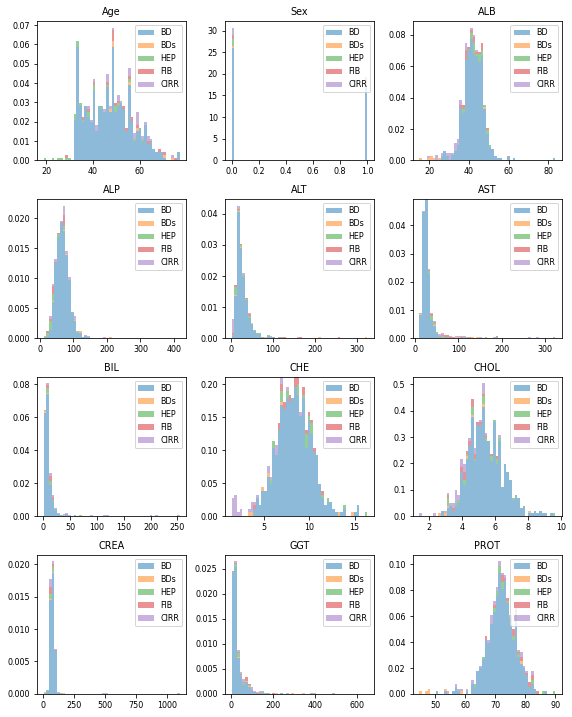

In [9]:
features_mean=list(df.columns[1:13])

# Separating the data 
dfA=df[df['Category'] == 0]
dfB=df[df['Category'] == 1]
dfC=df[df['Category'] == 2]
dfD=df[df['Category'] == 3]
dfE=df[df['Category'] == 4]

#Creating the window with 10 subplots.
plt.rcParams.update({'font.size': 8})
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(8,10))
axes = axes.ravel()
#Creating histograms with 50 bins
for idx,ax in enumerate(axes):
    ax.figure
    binwidth= (max(df[features_mean[idx]]) - min(df[features_mean[idx]]))/50
    ax.hist([dfA[features_mean[idx]],dfB[features_mean[idx]],dfC[features_mean[idx]],dfD[features_mean[idx]],dfE[features_mean[idx]]], bins=np.arange(min(df[features_mean[idx]]), max(df[features_mean[idx]]) + binwidth, binwidth) , alpha=0.5,stacked=True, density= True, label=['BD','BDs','HEP','FIB','CIRR'])
    ax.legend(loc='upper right')
    ax.set_title(features_mean[idx])
plt.tight_layout()
plt.show()

To better perceive the distribution of a feature data in each goal category, we've ploted a box diagram.

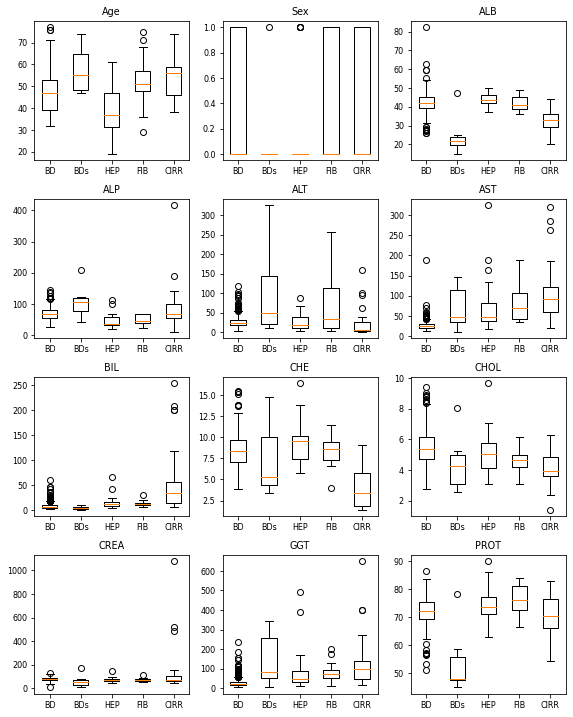

In [10]:
#Creating the window with 10 subplots.
plt.rcParams.update({'font.size': 8})
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(8,10))
axes = axes.ravel()
#BOXPLOTS
for idx,ax in enumerate(axes):
    ax.figure
    data_to_plot = [dfA[features_mean[idx]],dfB[features_mean[idx]],dfC[features_mean[idx]],dfD[features_mean[idx]],dfE[features_mean[idx]]]
    ax.boxplot(data_to_plot)
    ax.set_xticklabels(['BD','BDs','HEP','FIB','CIRR'])
    ax.set_title(features_mean[idx])

    
plt.tight_layout()
plt.show()

To explore the relation between each pair of features in the outcoming goal we've created scatter plots representing with different colours each of the goal categories and a plot for each pair.
In the diagonal, as the same feature is being compared with itself, the data is represented by an overlapping histogram for each goal category.

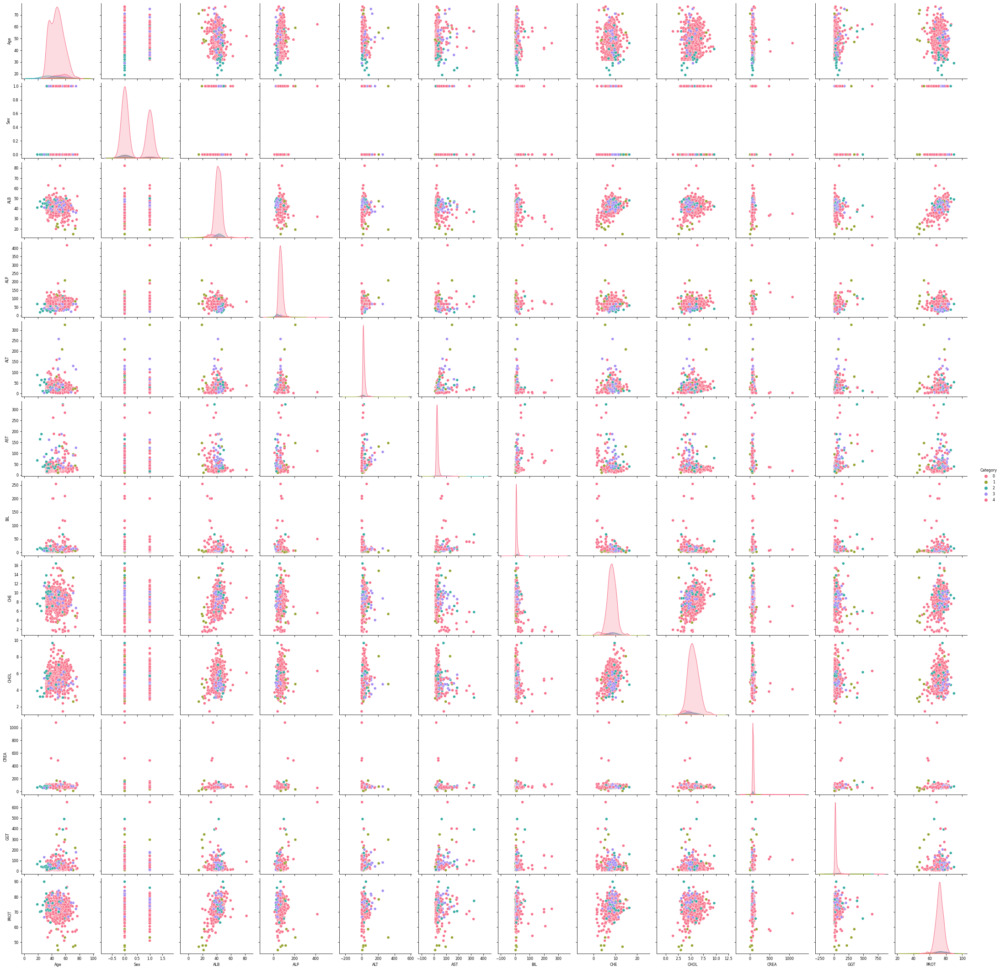

In [11]:
def scatter_pairs(data):
    sns.pairplot(data, hue="Category", palette="husl")
    
scatter_pairs(df)

We can get an idea of the features which have a higher weight on the result and are strong indicators of the presence of Hepatitis C.

In [12]:
#data correlation
df.corr()["Category"].abs().sort_values(ascending=False)

Category    1.000000
AST         0.648341
BIL         0.473006
GGT         0.471164
CHE         0.329472
CHOL        0.300254
ALB         0.285467
CREA        0.182040
ALT         0.106369
Age         0.106341
Sex         0.060657
ALP         0.028488
PROT        0.007160
Name: Category, dtype: float64

To view the correlation between each feature we've plotted a heat map. The features with higher correlation with each other are displayed as a red when there is a direct correlation, blue when there is an inverse correlation and white when there is no correlation.

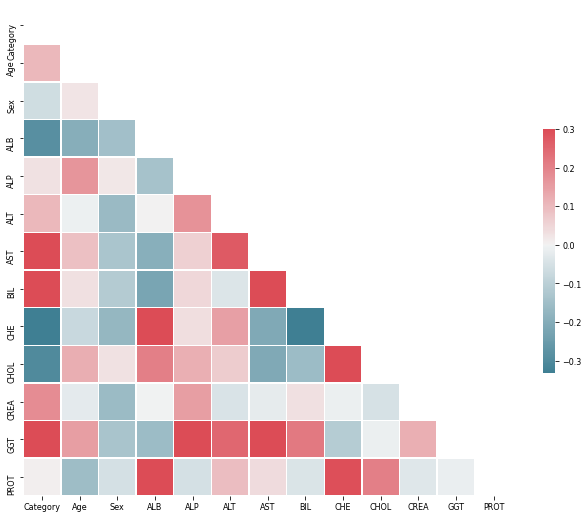

In [13]:
#correlation heat map
def correlation(data):
    corr = data.corr()

    # Generate a mask for the upper triangle
    mask = np.triu(np.ones_like(corr, dtype=np.bool))

    # Set up the matplotlib figure
    f, ax = plt.subplots(figsize=(11, 9))

    # Generate a custom diverging colormap
    cmap = sns.diverging_palette(220, 10, as_cmap=True)

    # Draw the heatmap with the mask and correct aspect ratio
    sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
                square=True, linewidths=.5, cbar_kws={"shrink": .5})
                
correlation(df)

We can see that AST, BIL and GGT are strong indicators of a liver disease, the higher they are the more likely is that the patient is sick. A value of CHE is an example of another indicator of a disease. We can also see that the sex and of the patient are practically irrelevant for the outcome of the diagnosis.